In [1]:
from __future__ import division, print_function
import os, glob, matplotlib.pyplot as plt, numpy as np, pandas as pd, math
%load_ext autoreload
%autoreload 2
np.set_printoptions(precision=6, suppress=True)
#%matplotlib notebook
%matplotlib inline

In [2]:
df, grad = {}, {}
duration, subjects, levels = [], [], []

for file in glob.glob(os.path.join('..', 'datadir', 'pilot', '*csv')):
    df_ = pd.read_csv(file, '\t')

    _, fname = os.path.split(file)
    fname, ext = fname.split('.')
    date, time, _, level, subj = fname.split('_')
    print('Gathering data for', subj, 'at ', level)

    if subj not in subjects:
        subjects.append(subj)
    if level not in levels:
        levels.append(level)

    try:
        df[subj][level] = {}
        grad[subj][level] = {}
    except:
        df[subj] = {}
        df[subj][level] = {}
        grad[subj] = {}
        grad[subj][level] = {}

    for axis in ['T', 'X', 'Y']:
        for obj in ['gaze', 'ball', 'paddle']:
            df[subj][level][axis+obj] = df_[axis+obj]

    duration.append(float(str(round(df[subj][level]['Tgaze'][len(df[subj][level]['Tgaze'])-1] - df[subj][level]['Tgaze'][0],3)))) # retrieve the lengths of the levels

    """ Gradients """
    N_start, N_stop = 0, int((df[subj][level]['Tgaze'][len(df[subj][level]['Tgaze'])-1] - df[subj][level]['Tgaze'][0])*30)

    # find the moment when the ball collide with an element from below
    grad_, value_old, value_older = [], 0, 0
    for k, value in enumerate(np.gradient(df[subj][level]['Yball'])[N_start:N_stop]):        
        if value < 0 and  value_older > 0:
            grad_.append(k)
                
        value_older = value_old
        value_old = value
        
    grad[subj][level] = grad_

print("Duration per level (in seconds) = " + str(duration))
print("Total duration = " + str(round(sum(duration)/60, 2)) + " min")

Gathering data for juliette at  lvl1
Gathering data for juliette at  lvl2
Gathering data for juliette at  lvl3
Gathering data for juliette at  lvl4
Gathering data for juliette at  lvl5
Gathering data for juliette at  lvl6
Gathering data for remi at  lvl1
Gathering data for remi at  lvl2
Gathering data for remi at  lvl3
Gathering data for remi at  lvl4
Gathering data for remi at  lvl5
Gathering data for remi at  lvl6
Gathering data for valerie at  lvl1
Gathering data for valerie at  lvl2
Gathering data for valerie at  lvl3
Gathering data for valerie at  lvl4
Gathering data for valerie at  lvl5
Gathering data for valerie at  lvl6
Gathering data for elisa at  lvl1
Gathering data for elisa at  lvl2
Gathering data for elisa at  lvl3
Gathering data for elisa at  lvl4
Gathering data for elisa at  lvl5
Gathering data for elisa at  lvl6
Gathering data for maxime at  lvl1
Gathering data for maxime at  lvl2
Gathering data for maxime at  lvl3
Gathering data for maxime at  lvl4
Gathering data for m

juliette
lvl1


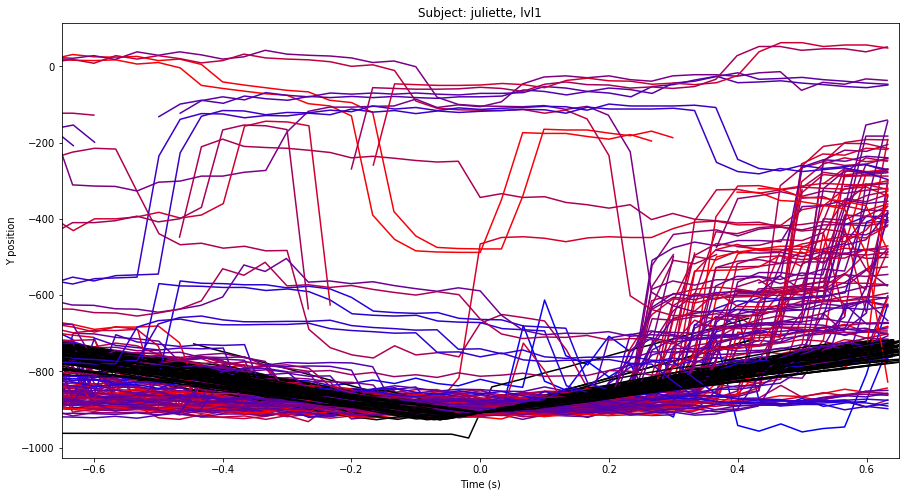

lvl2


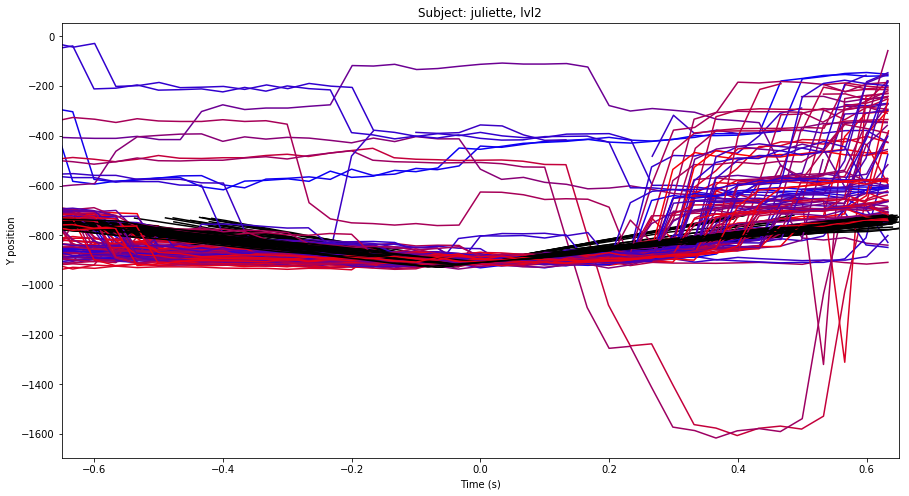

lvl3


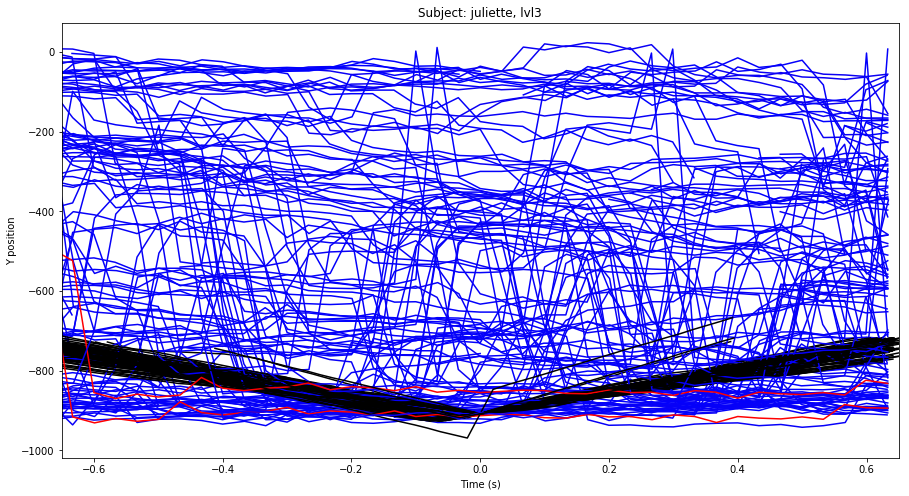

lvl4


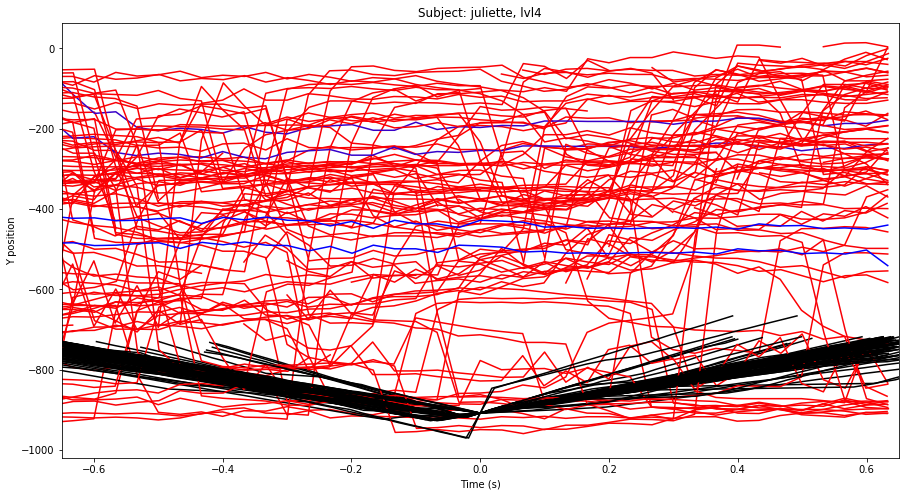

lvl5


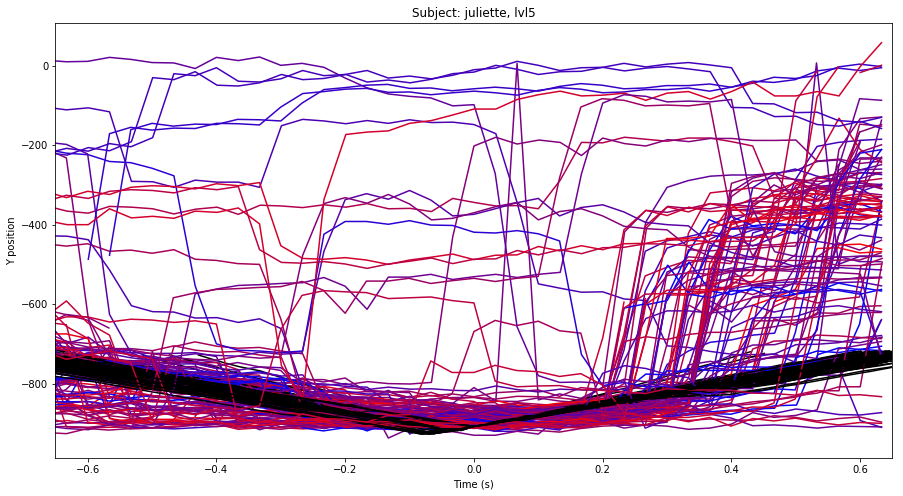

lvl6


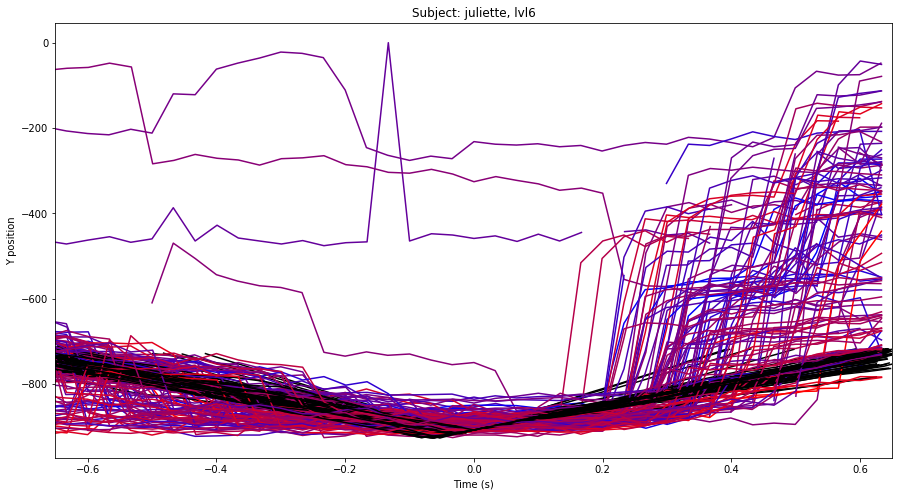

remi
lvl1


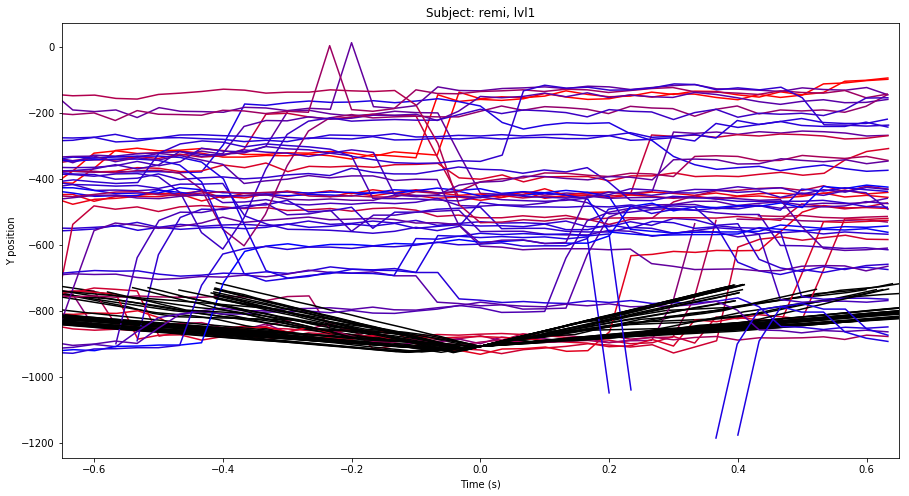

lvl2


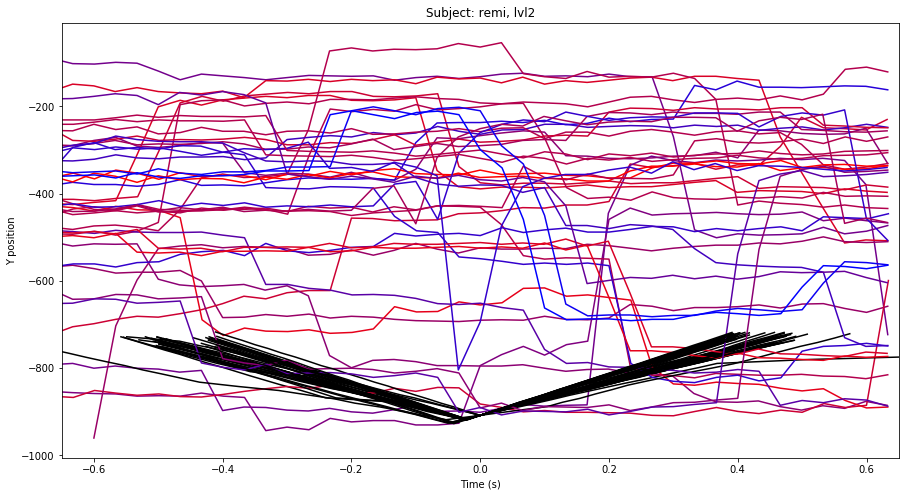

lvl3


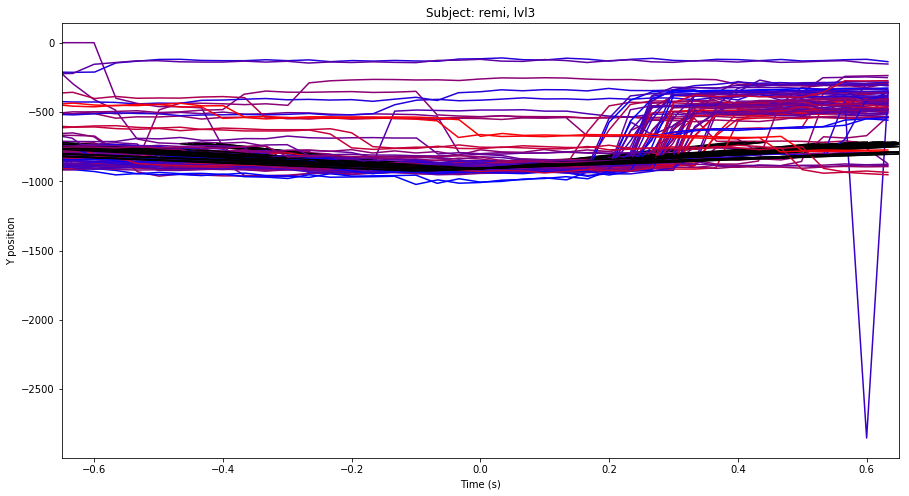

lvl4


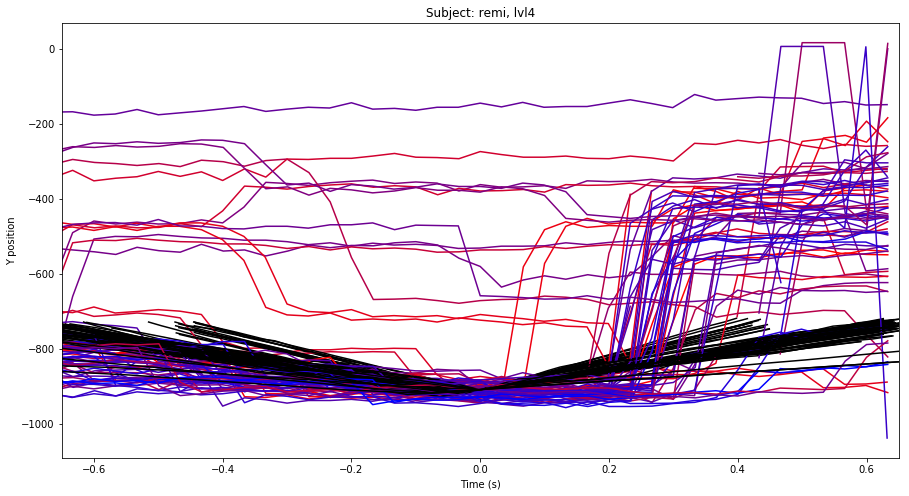

lvl5


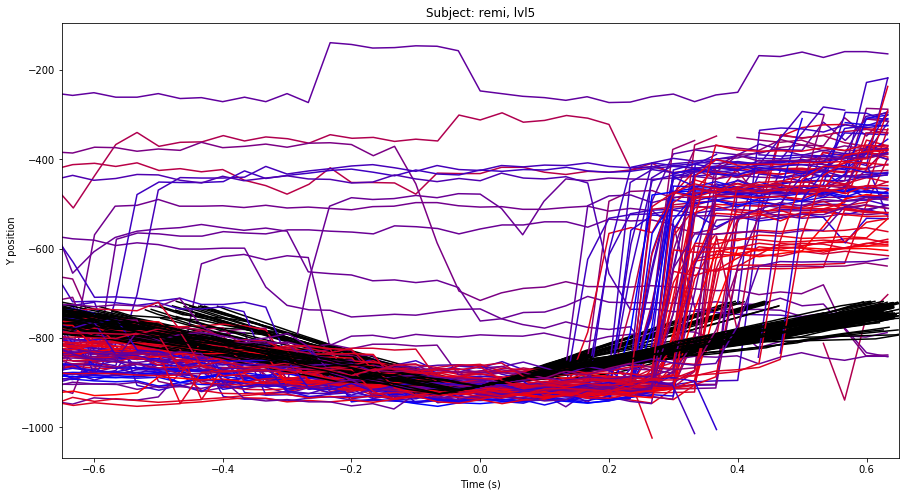

lvl6


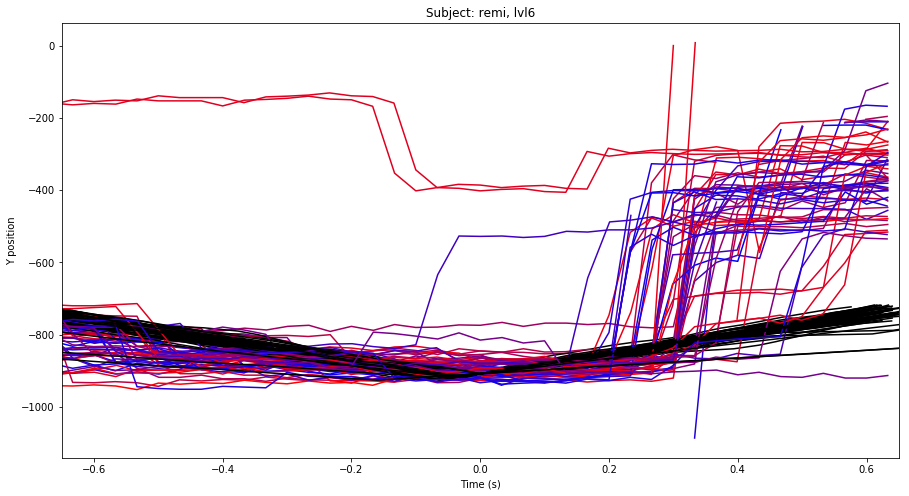

valerie
lvl1


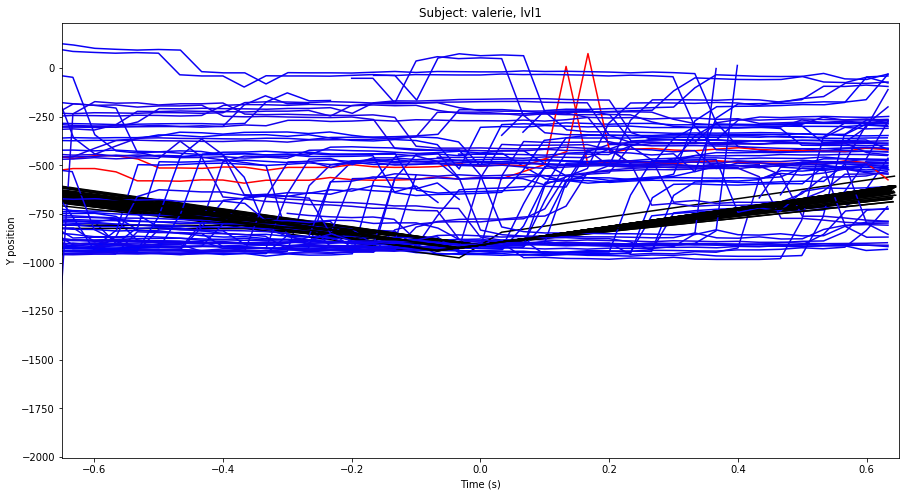

lvl2


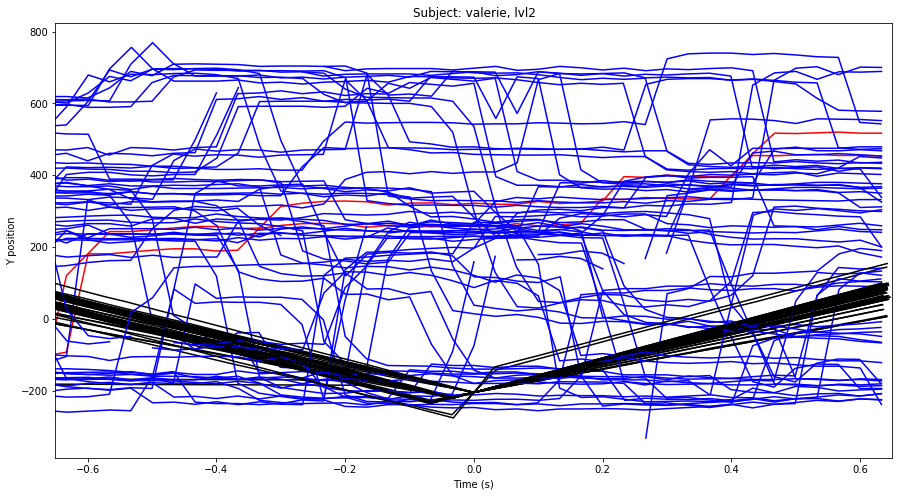

lvl3


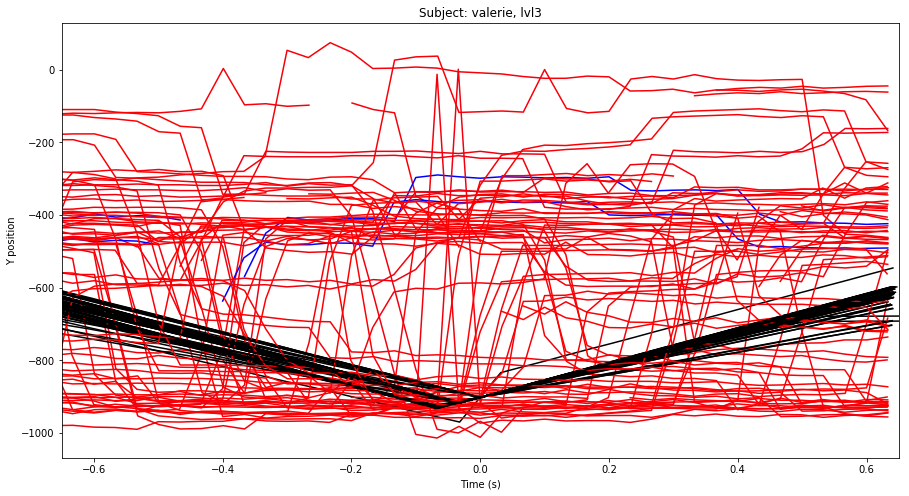

lvl4


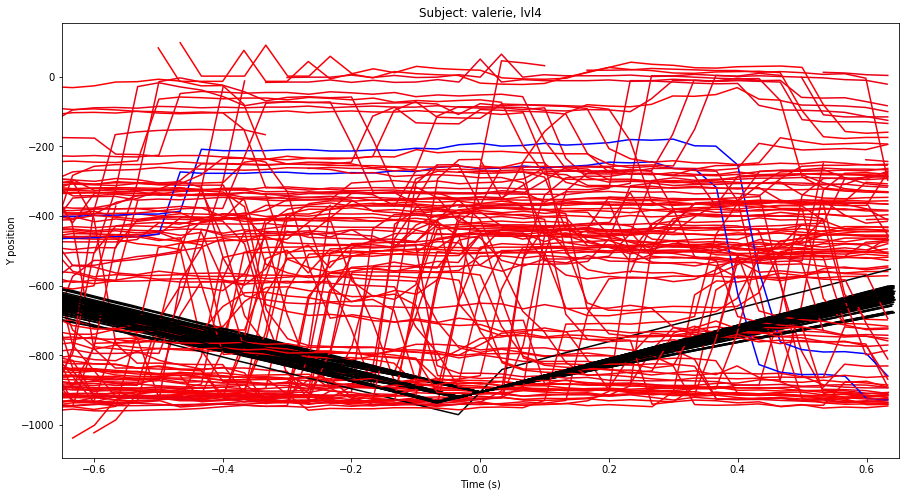

lvl5


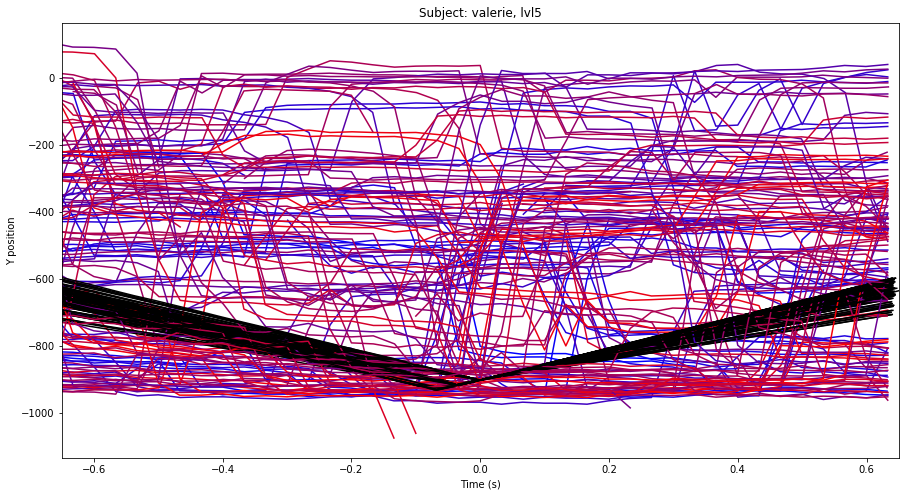

lvl6


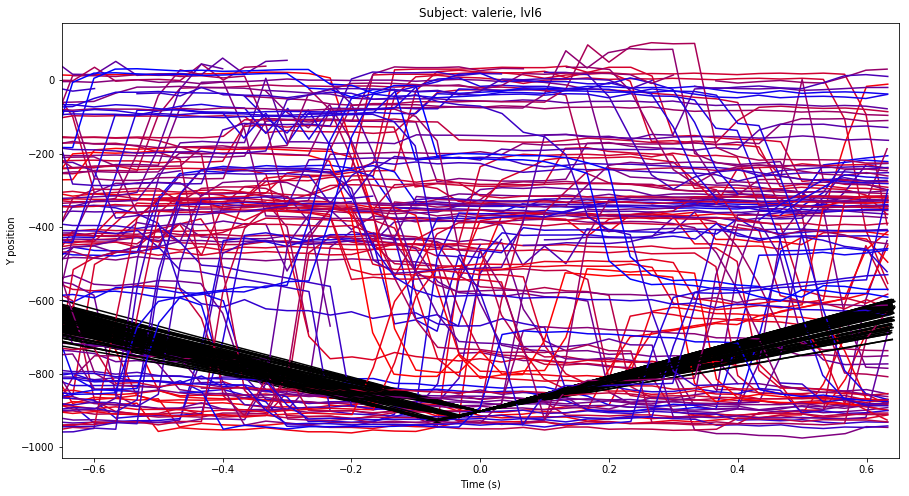

elisa
lvl1


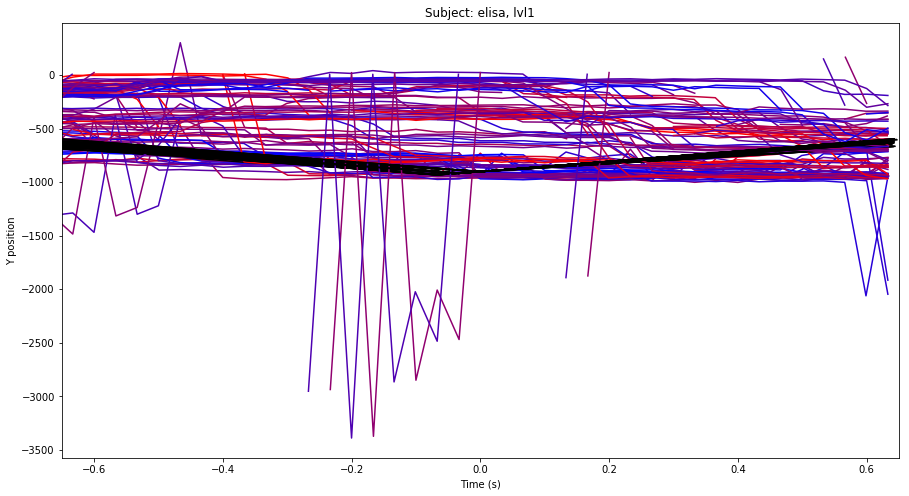

lvl2


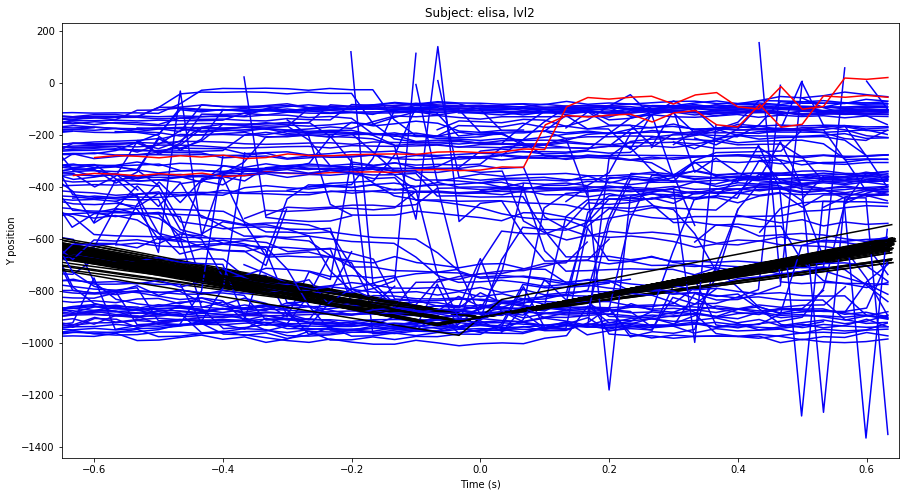

lvl3


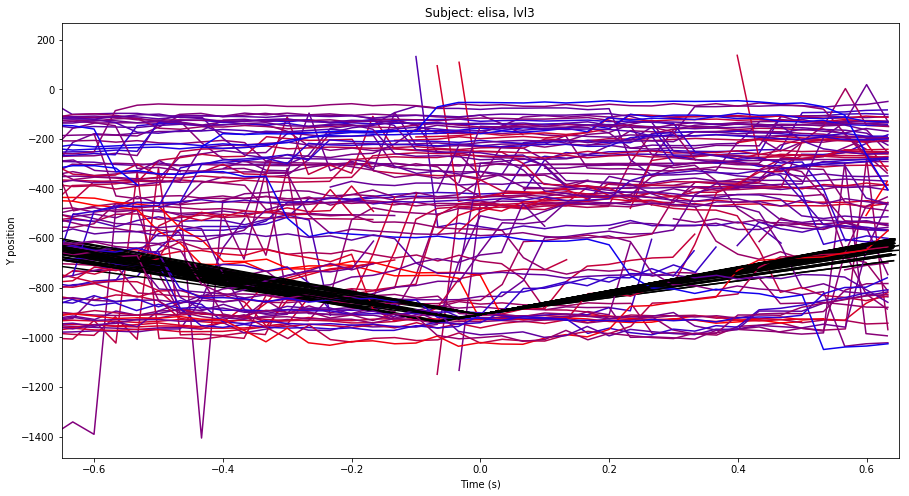

lvl4


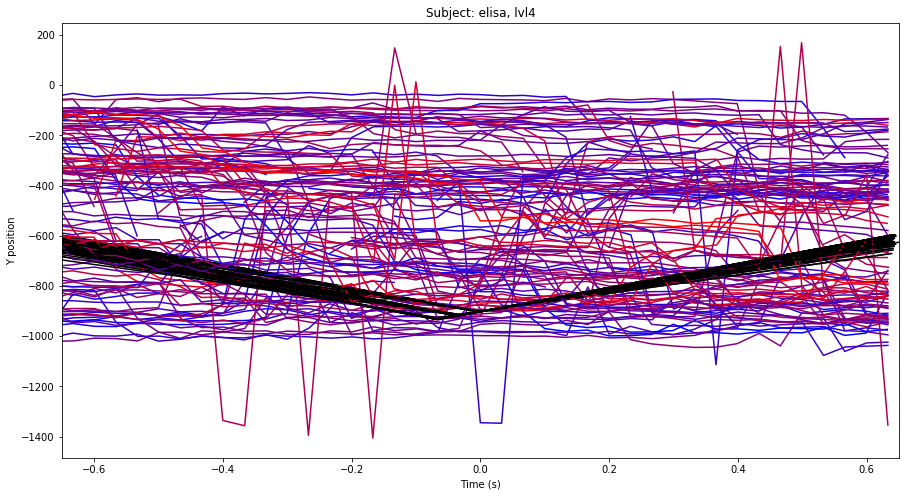

lvl5


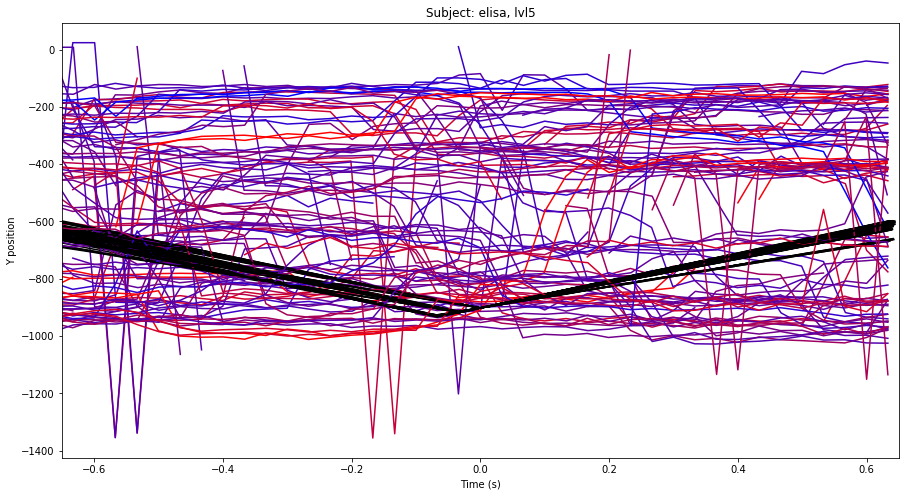

lvl6


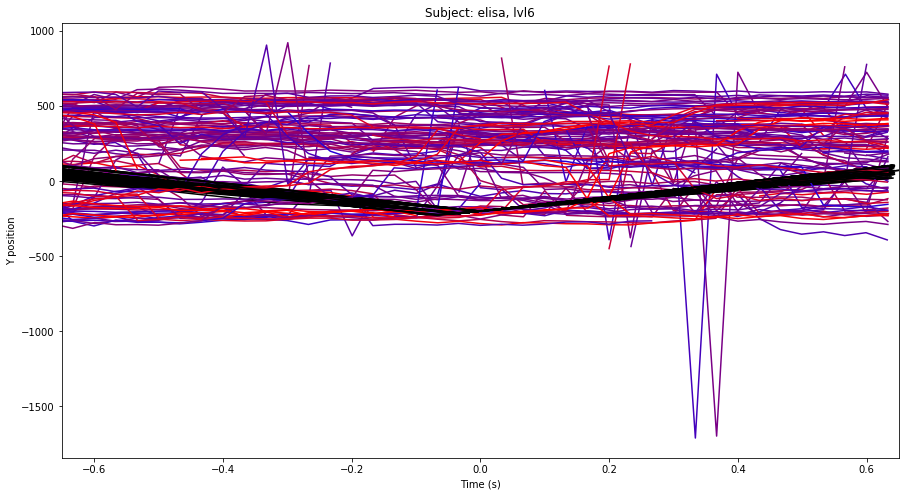

maxime
lvl1


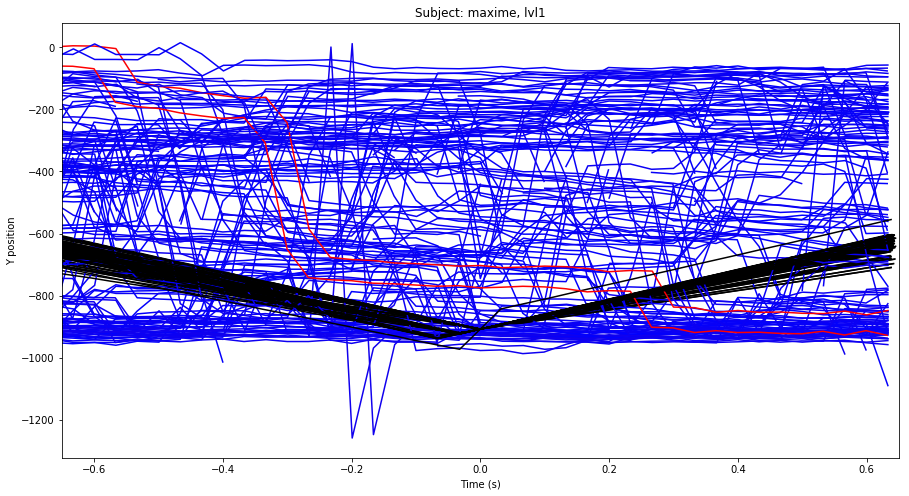

lvl2


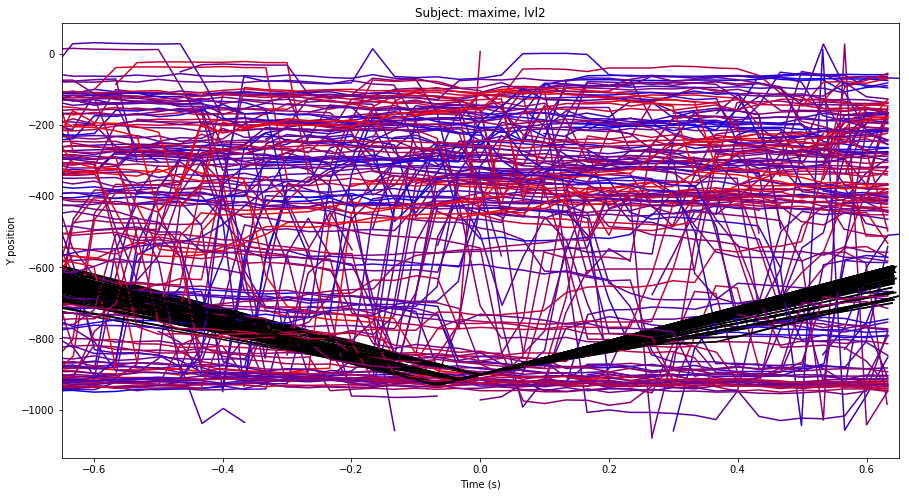

lvl3


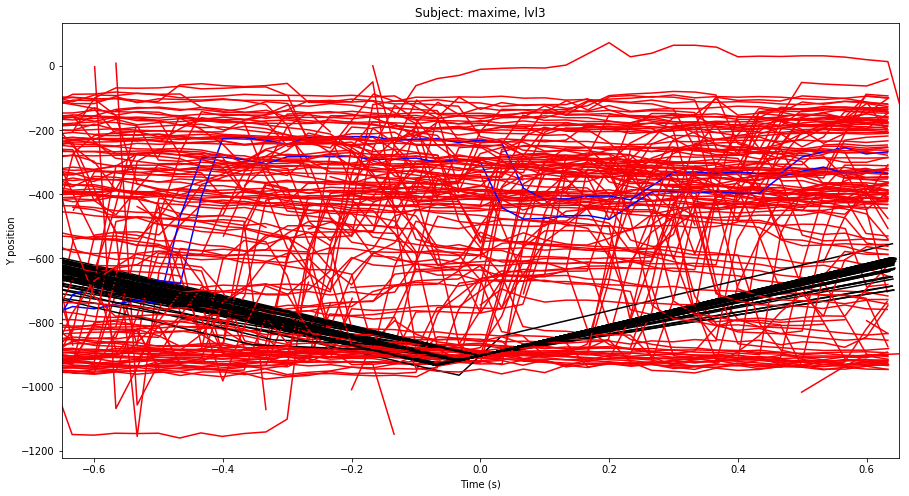

lvl4


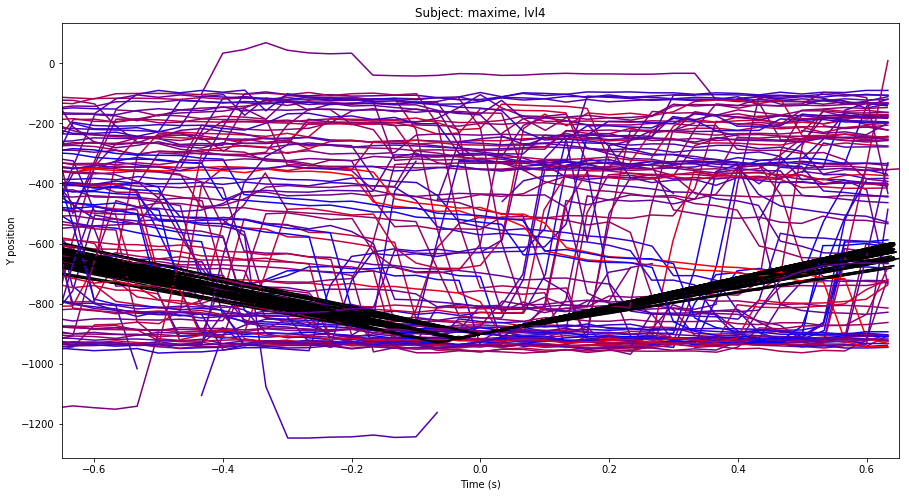

lvl5


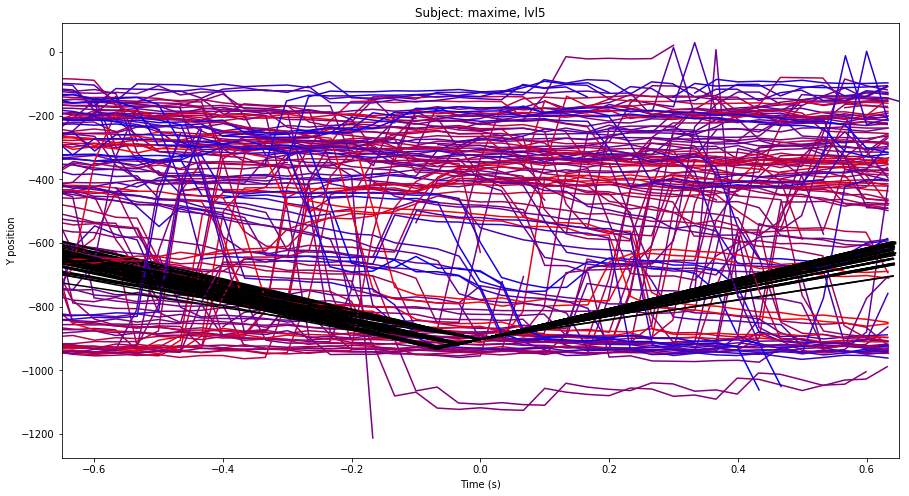

lvl6


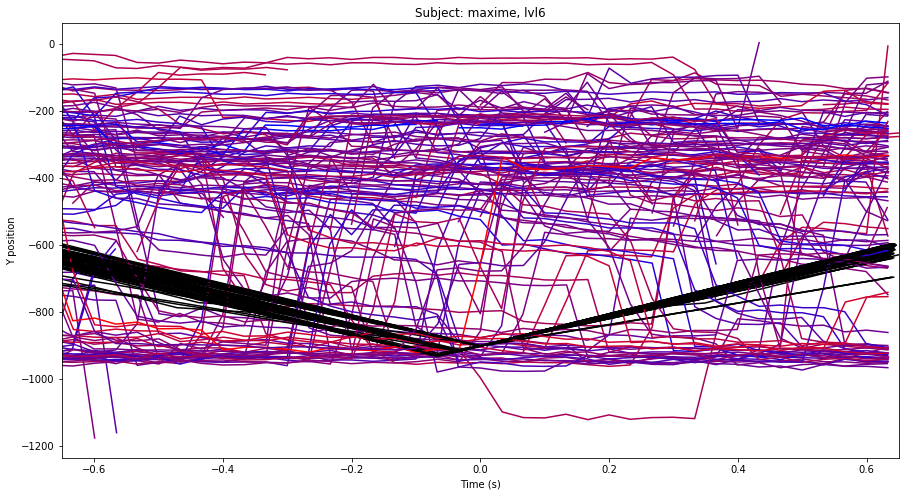

jade
lvl1


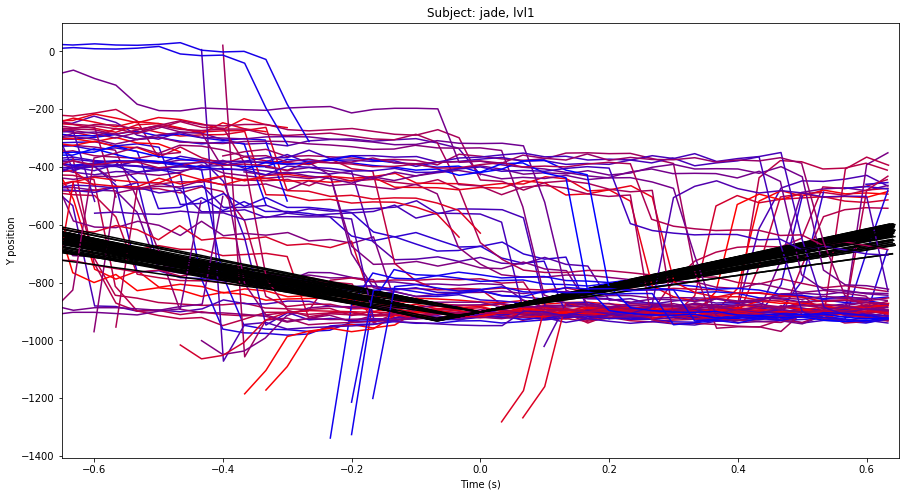

lvl2


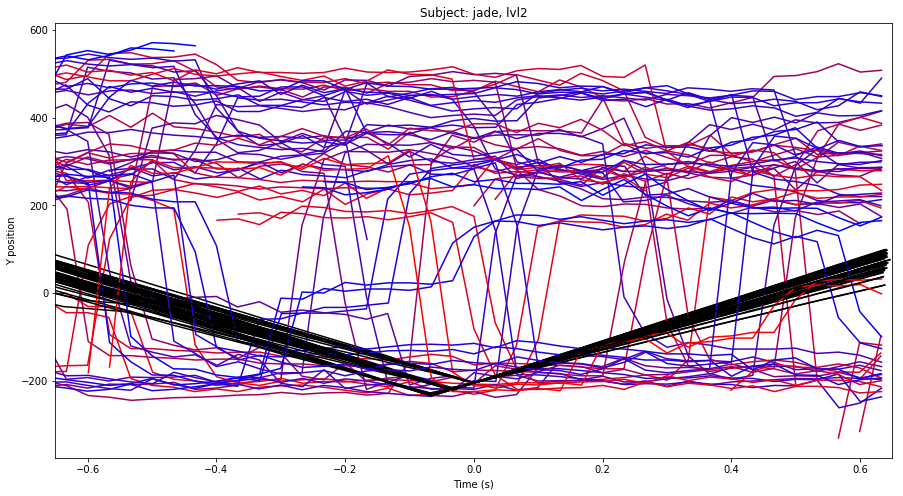

lvl3


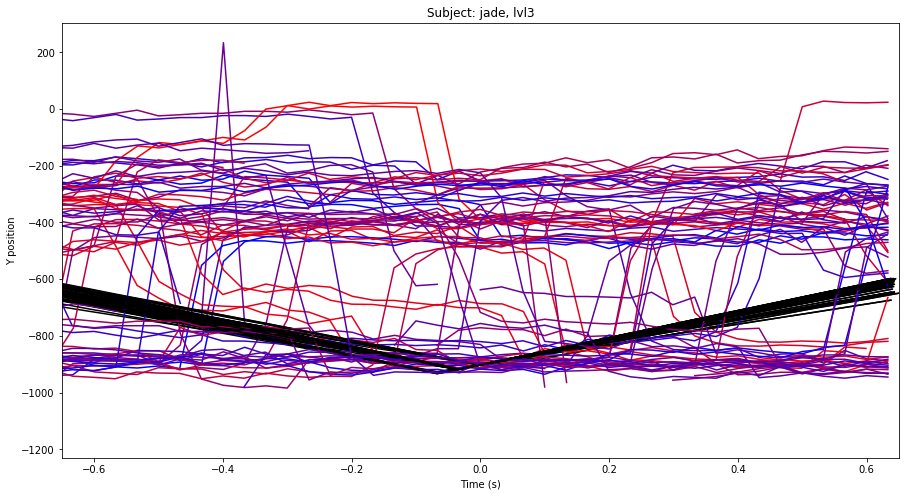

lvl4


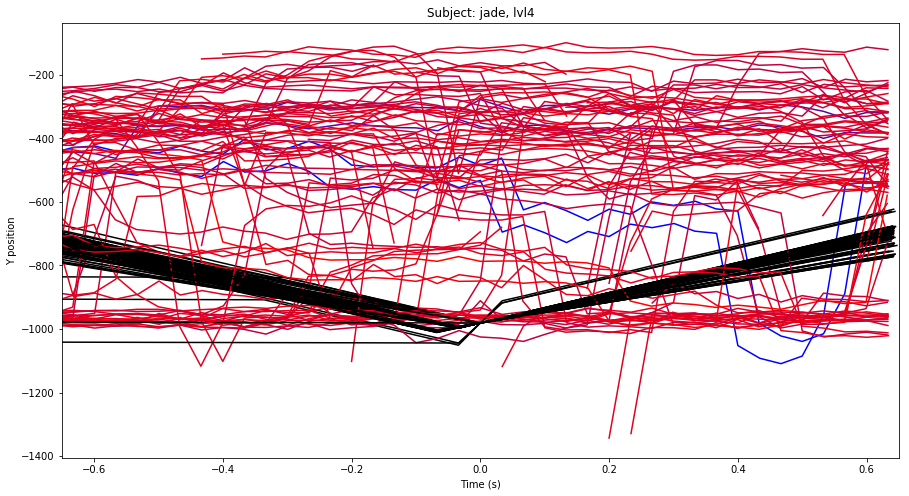

lvl5


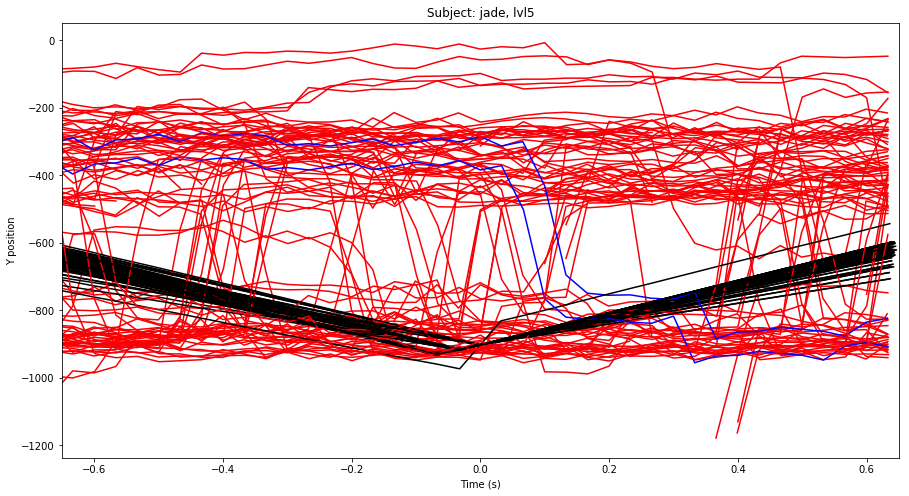

lvl6


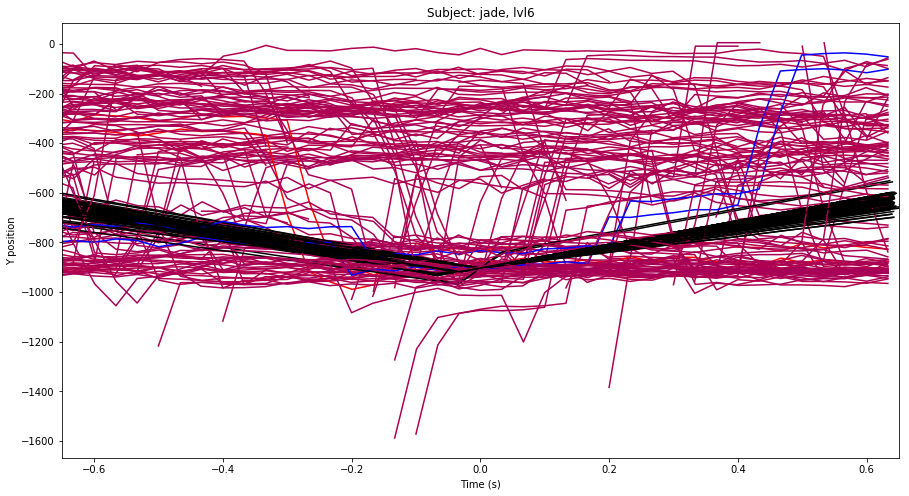

In [3]:
deltav = 20
for subj in subjects:
    print(subj)
    for level in levels:
        print(level)
        grad_h_abs = []
        for v in grad[subj][level]:
            grad_h_abs.append(df[subj][level]['Xball'][v+1] - df[subj][level]['Xball'][v-1])

        grad_h = np.array(grad_h_abs)
        grad_h -= grad_h.min() # valeur min fixée à 0
        grad_h /= grad_h.max() # normalisation entre 0 et 1

        fig, ax = plt.subplots(figsize=(15,8))
        for v, g_h, g_h_abs in zip(grad[subj][level], grad_h, grad_h_abs):
            if df[subj][level]['Yball'][v] > 850:
                c = [1-g_h, 0, g_h]
                diff = df[subj][level]['Yball'][grad[subj][level][0]] - df[subj][level]['Yball'][v]
                ax.plot(df[subj][level]['Tgaze'][v-deltav:v+deltav]-df[subj][level]['Tgaze'][v], -np.array(df[subj][level]['Ygaze'][v-deltav:v+deltav]) - diff, c=c, label='%0.3f' % g_h_abs)
                ax.plot(df[subj][level]['Tpaddle'][v-deltav:v+deltav]-df[subj][level]['Tpaddle'][v], -np.array(df[subj][level]['Yball'][v-deltav:v+deltav]) - diff, 'k')

                ax.set_title('Subject: %s, %s' %(subj, level))
                ax.set_ylabel('Y position')
                ax.set_xlabel('Time (s)')
                ax.set_xlim(-0.65, 0.65)
                #ax.legend(loc='center left')
        plt.show()

In [4]:
"""deltav = 40
for subj in subjects:
    print("Subject: ", subj)
    for level in levels:
        print(level)
        for v in grad[subj][level]:
            fig, ax = plt.subplots(figsize=(15,8))
            try:
                ax.plot(df[subj][level]['Tgaze'][0:2*deltav]-df[subj][level]['Tgaze'][deltav], np.sqrt((df[subj][level]['Ygaze'][v-deltav:v+deltav]- df[subj][level]['Yball'][v-deltav:v+deltav])**2 + (df[subj][level]['Xgaze'][v-deltav:v+deltav]-df[subj][level]['Xball'][v-deltav:v+deltav])**2), 'g')
                ax.plot(df[subj][level]['Tgaze'][0:2*deltav]-df[subj][level]['Tgaze'][deltav], np.sqrt((df[subj][level]['Ygaze'][v-deltav:v+deltav]- df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v-deltav:v+deltav]-df[subj][level]['Xball'][v])**2), 'r')
                ax.plot([0, 0], [0, 800], 'k--')
            except:
                pass
            ax.set_title('Subject: %s, %s' %(subj, level))
            ax.set_ylabel('Distance')
            ax.set_xlabel('Time (s)')
            ax.set_ylim(0, 800)"""

'deltav = 40\nfor subj in subjects:\n    print("Subject: ", subj)\n    for level in levels:\n        print(level)\n        for v in grad[subj][level]:\n            fig, ax = plt.subplots(figsize=(15,8))\n            try:\n                ax.plot(df[subj][level][\'Tgaze\'][0:2*deltav]-df[subj][level][\'Tgaze\'][deltav], np.sqrt((df[subj][level][\'Ygaze\'][v-deltav:v+deltav]- df[subj][level][\'Yball\'][v-deltav:v+deltav])**2 + (df[subj][level][\'Xgaze\'][v-deltav:v+deltav]-df[subj][level][\'Xball\'][v-deltav:v+deltav])**2), \'g\')\n                ax.plot(df[subj][level][\'Tgaze\'][0:2*deltav]-df[subj][level][\'Tgaze\'][deltav], np.sqrt((df[subj][level][\'Ygaze\'][v-deltav:v+deltav]- df[subj][level][\'Yball\'][v])**2 + (df[subj][level][\'Xgaze\'][v-deltav:v+deltav]-df[subj][level][\'Xball\'][v])**2), \'r\')\n                ax.plot([0, 0], [0, 800], \'k--\')\n            except:\n                pass\n            ax.set_title(\'Subject: %s, %s\' %(subj, level))\n            ax.set_ylabel

In [9]:
import re
deltav = 10000
t_mean, lvl, t_mean_ = {}, {}, []
for subj in subjects:
    print("Subject: ", subj)
    t_mean[subj], lvl[subj] = [], []
    for level in levels:
        t_sacc = []
        print(level)
        for v in grad[subj][level]:
            distance = (df[subj][level]['Ygaze'][v] - df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v] - df[subj][level]['Xball'][v])**2
            distance = np.sqrt(distance)
                
            if distance < 200:
                i = v-1
                distance = (df[subj][level]['Ygaze'][v:v+deltav] - df[subj][level]['Yball'][v])**2 + (df[subj][level]['Xgaze'][v:v+deltav] - df[subj][level]['Xball'][v])**2
                distance = np.sqrt(distance)
                derivate = np.diff(distance)
                if len(distance) != len(derivate):
                    derivate = np.append(derivate, np.nan)
                for x in distance:
                    i += 1
                    if derivate[i-v] > 20:
                        t_sacc.append(df[subj][level]['Tgaze'][i]-df[subj][level]['Tgaze'][v])
                        break
        if np.std(t_sacc) < 7/10*np.mean(t_sacc):
            t_mean[subj].append(np.mean(t_sacc))
            t_mean_.append(np.mean(t_sacc))
            lvl[subj].append(re.findall(r'\d+', level)[0])
            print(np.mean(t_sacc), '+/-', np.std(t_sacc))
print(lvl)

Subject:  juliette
lvl1
0.307887746363 +/- 0.152501435382
lvl2
0.281643560617 +/- 0.11192143913
lvl3
lvl4
0.52682352066 +/- 0.29276030403
lvl5
0.272258053544 +/- 0.111274059827
lvl6
0.286469014345 +/- 0.0895991125115
Subject:  remi
lvl1
lvl2
0.382999897003 +/- 0.217000007629
lvl3
0.289644736993 +/- 0.198278638858
lvl4
0.274972983309 +/- 0.149462632034
lvl5
0.267089135576 +/- 0.10814395215
lvl6
0.269202702754 +/- 0.120928819269
Subject:  valerie
lvl1
lvl2
0.477333386739 +/- 0.243852817331
lvl3
lvl4
lvl5
lvl6
Subject:  elisa
lvl1
0.477393945058 +/- 0.316490266345
lvl2
lvl3
0.349500000477 +/- 0.241856511219
lvl4
0.396111196942 +/- 0.250327917859
lvl5
lvl6
0.454999844233 +/- 0.0873765042985
Subject:  maxime
lvl1
0.467065189196 +/- 0.298418116123
lvl2
lvl3
lvl4
0.451249992847 +/- 0.18442227923
lvl5
lvl6
0.489499950409 +/- 0.331727971589
Subject:  jade
lvl1
0.437809552465 +/- 0.2645948627
lvl2
0.220999977805 +/- 0.151795933122
lvl3
0.343099999428 +/- 0.220051127347
lvl4
lvl5
lvl6
{'juliette'

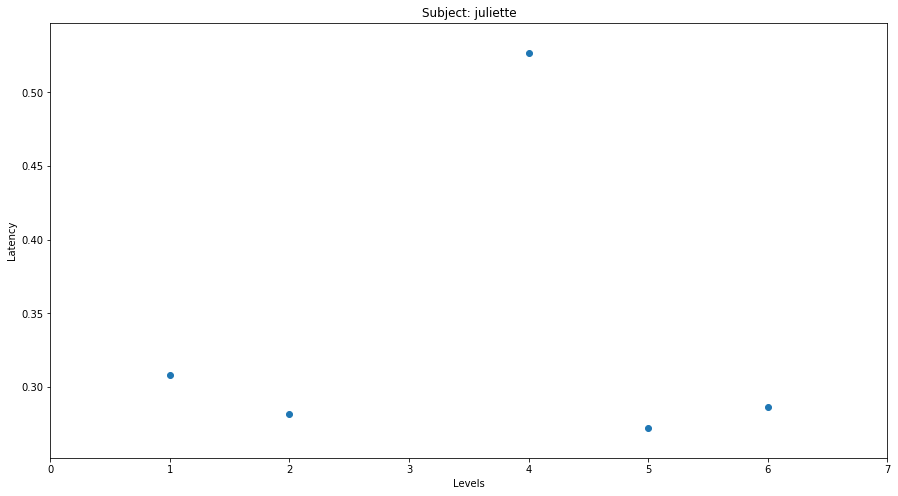

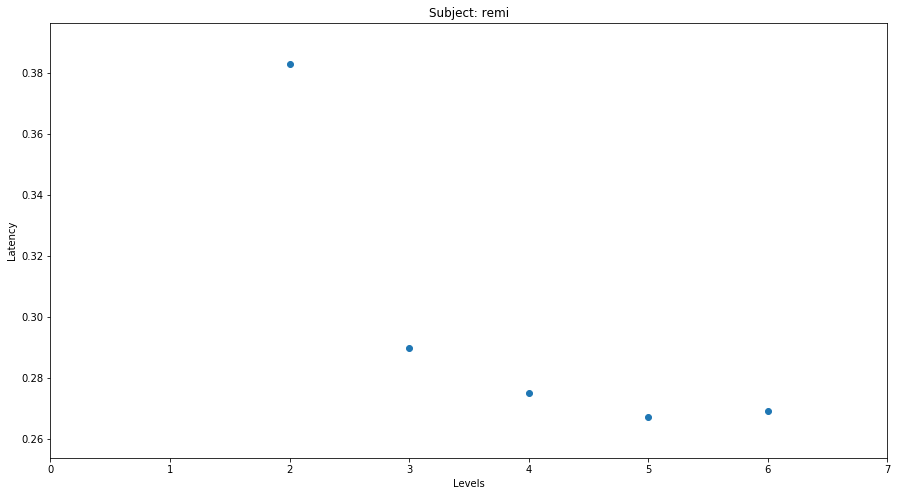

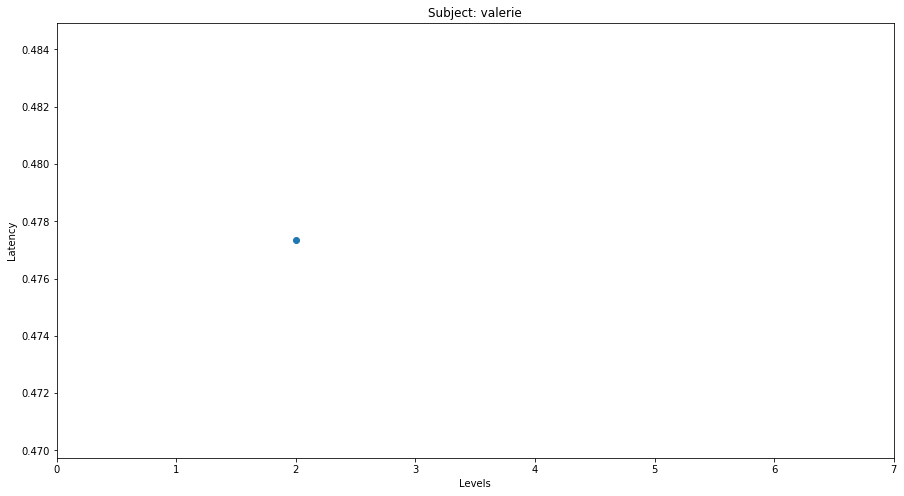

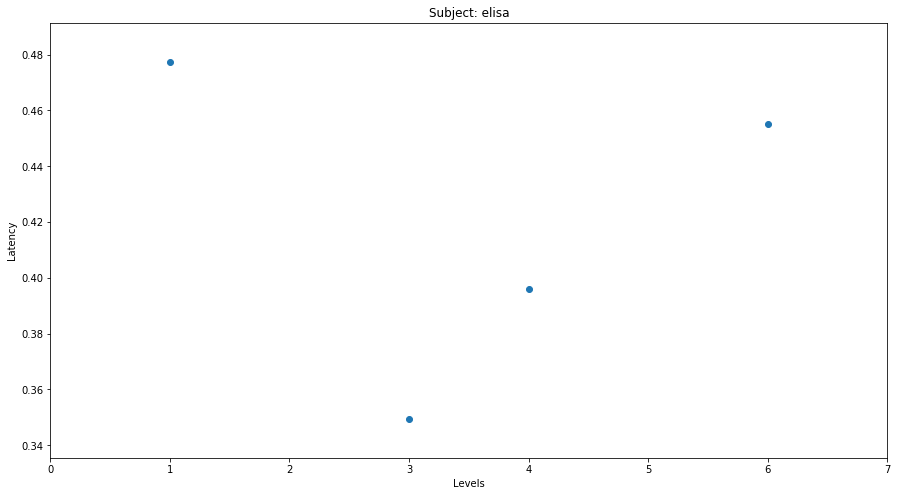

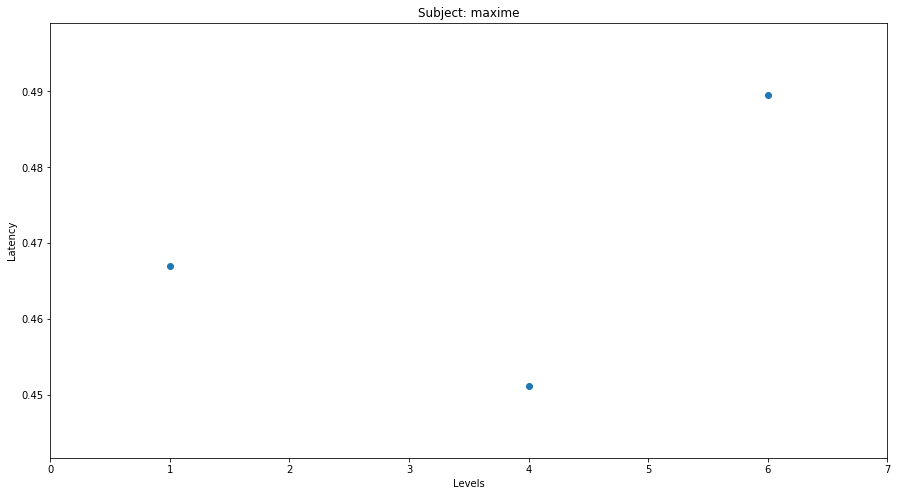

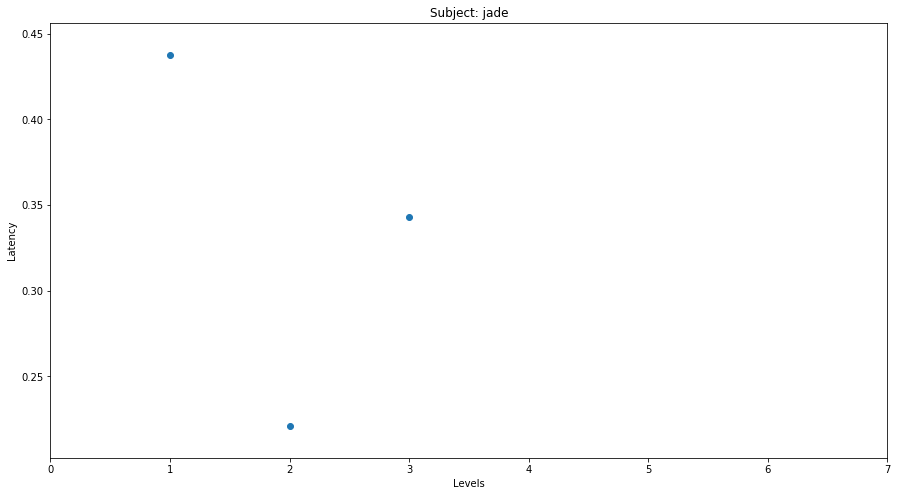

In [15]:
for subj in subjects:
    fig, ax = plt.subplots(figsize=(15,8))
    ax.scatter(lvl[subj], t_mean[subj])
    ax.set_title('Subject: ' + subj)
    ax.set_xlabel('Levels')
    ax.set_ylabel('Latency')
    ax.set_xlim(0, 7)

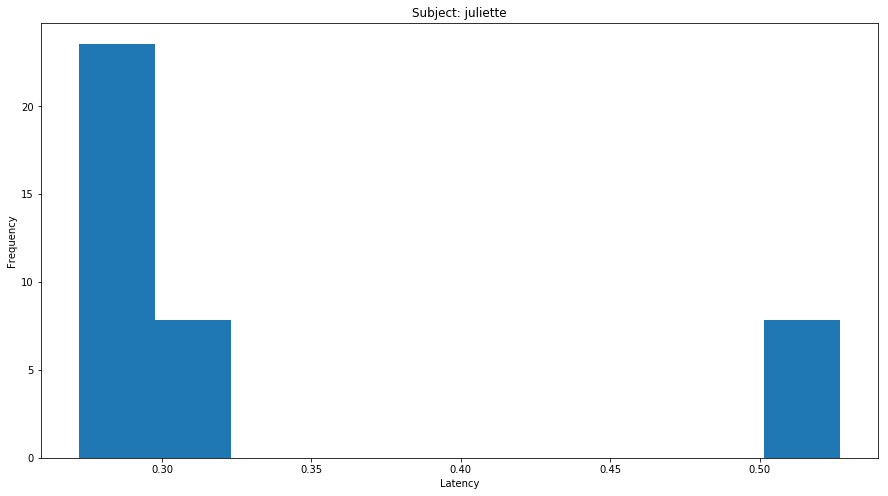

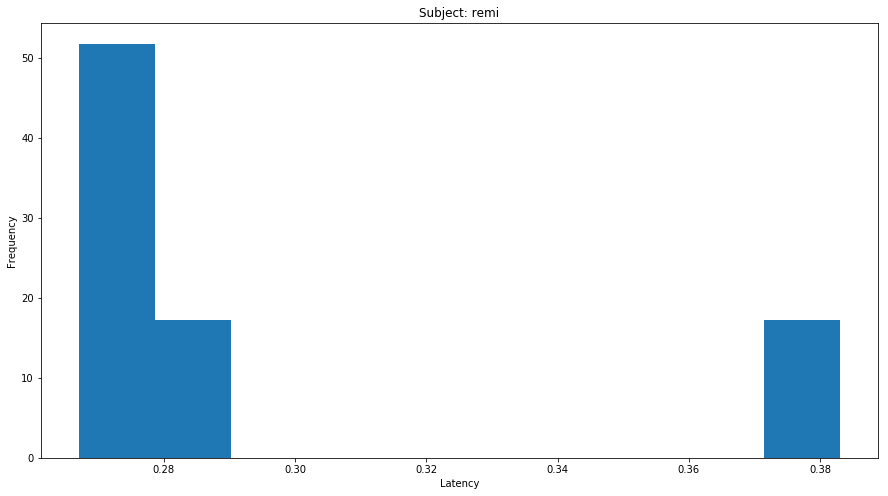

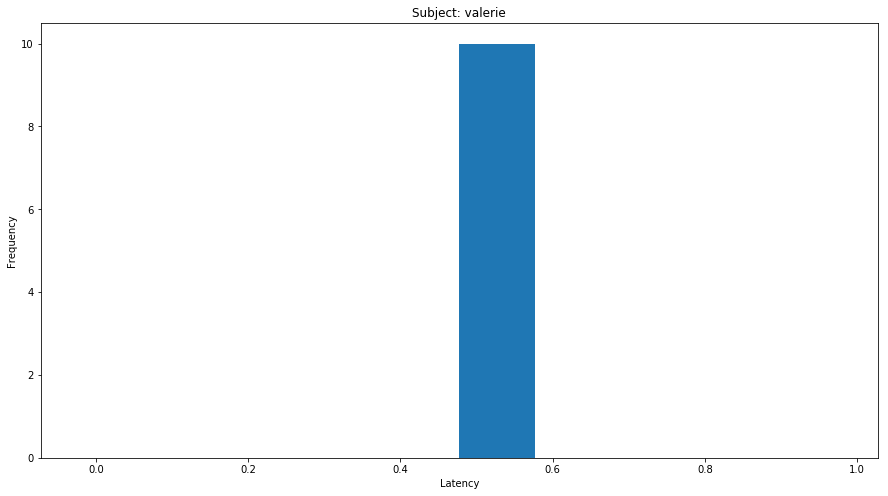

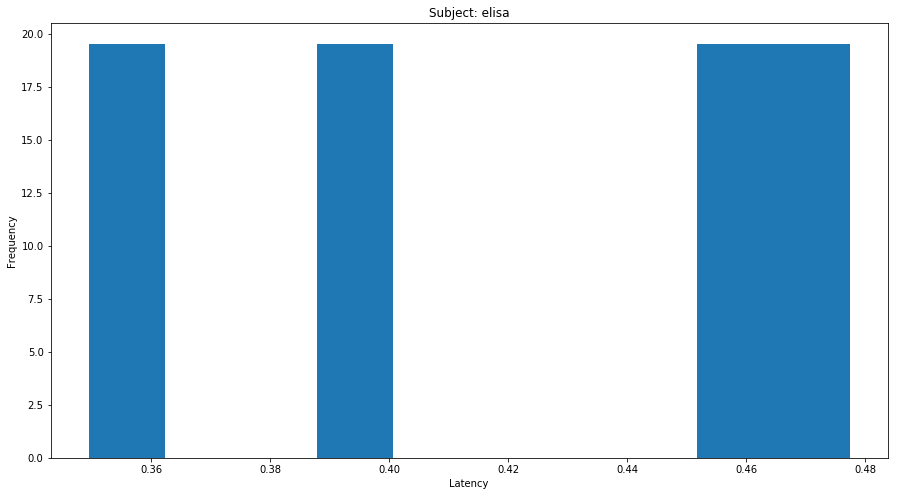

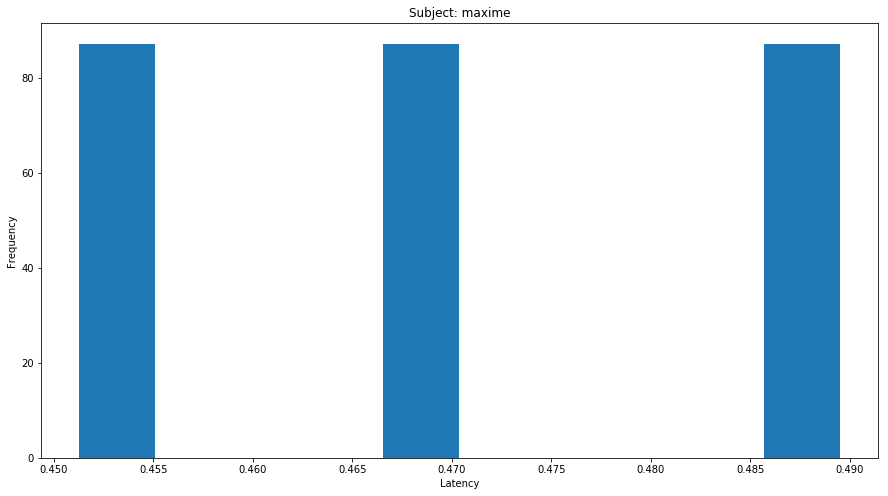

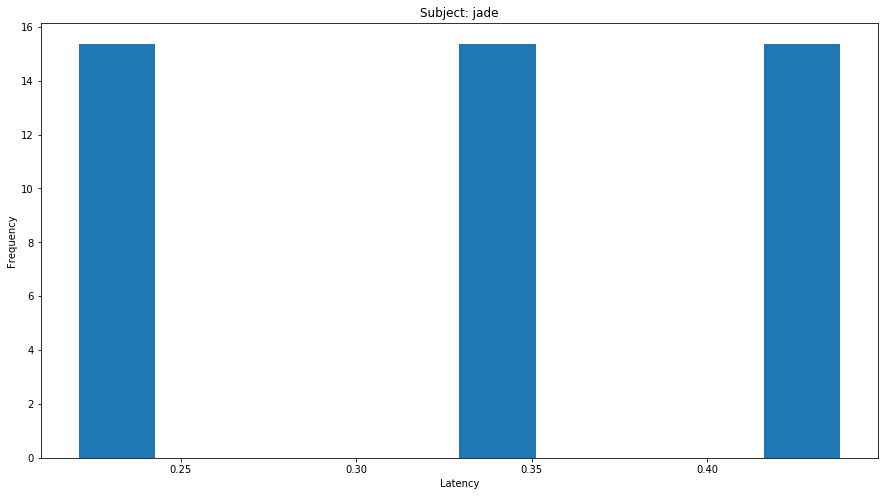

In [14]:
for subj in subjects:
    fig, ax = plt.subplots(figsize=(15,8))
    ax.hist(t_mean[subj], normed=True)
    ax.set_title('Subject: ' + subj)
    ax.set_xlabel('Latency')
    ax.set_ylabel('Frequency')

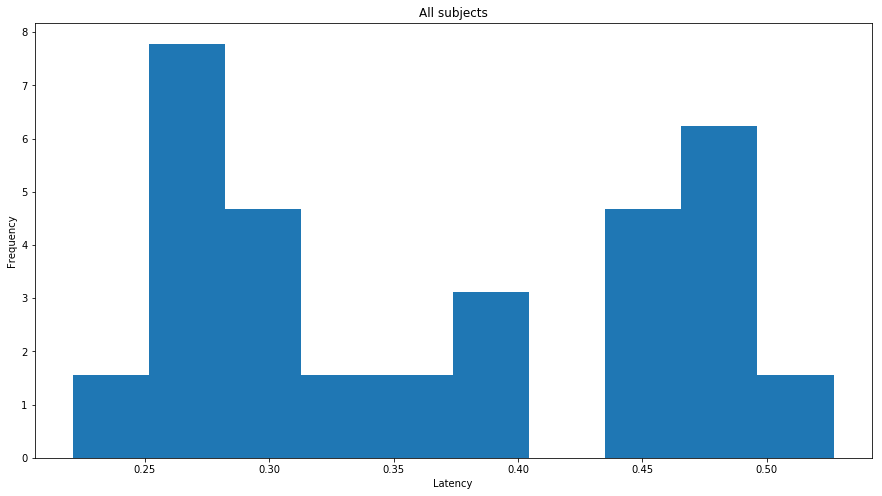

In [13]:
plt.figure(figsize=(15,8))
plt.hist(t_mean_, normed=True)
plt.title('All subjects')
plt.xlabel('Latency')
plt.ylabel('Frequency')

distribution des latences pour chaque niveau de p (+ paddle) - au debut pour chaque sujet
